# GradCam

In [1]:
%matplotlib inline

import torch
import torch.nn as nn
from torch.utils import data
from torchvision.models import vgg16
from torchvision import transforms
from torchvision import datasets
import matplotlib.pyplot as plt
import numpy as np
import os
import torch.optim as optim
import matplotlib.pyplot as plt

#Mounting Google Drive data
from google.colab import drive
drive.mount('/content/gdrive')

# Root directory of interest
gdrivePath = F"gdrive/MyDrive/ML_AI"

# Dataset containing images
dataset_path = gdrivePath + "/NatureDataset"

# Path where the resulting images are saved
saving_path = gdrivePath + "/NatureDatasetNew_GradCam"
if not os.path.exists(saving_path):
    os.makedirs(saving_path)
    print("\n", saving_path, "  created!\n")

# Trained Neural Network path, to use to compute GradCam images
best_resnet18_path = gdrivePath + "/CNN_finalMetrics/resnet/resnet18_LR(0_001)_nEpochs(30)/resnet18_best_LR(0_001)_nEpochs(30).pth"
print("\n\nResNet trained model: ", best_resnet18_path)
print("Does it exist? ", os.path.exists(best_resnet18_path), "\n\n")

best_vgg16_path = gdrivePath + "/CNN_finalMetrics/vgg/vgg16_LR(0_001)_nEpochs(30)/vgg16_best_LR(0_001)_nEpochs(30).pth"
print("VGG16 trained model: ", best_vgg16_path)
print("Does it exist? ", os.path.exists(best_vgg16_path), "\n\n")

#Use GPU device
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Used device:", device, "\n\n")

print(dataset_path, " exist? ", os.path.exists(dataset_path))
list_subfolders = [f.name for f in os.scandir(dataset_path) if f.is_dir()]
print(dataset_path)
space_str = " " * (len(dataset_path)-7)
for subf in list_subfolders:
    print(space_str, "'-> ", subf)

!pip install grad-cam

Mounted at /content/gdrive


ResNet trained model:  gdrive/MyDrive/ML_AI/CNN_finalMetrics/resnet/resnet18_LR(0_001)_nEpochs(30)/resnet18_best_LR(0_001)_nEpochs(30).pth
Does it exist?  True 


VGG16 trained model:  gdrive/MyDrive/ML_AI/CNN_finalMetrics/vgg/vgg16_LR(0_001)_nEpochs(30)/vgg16_best_LR(0_001)_nEpochs(30).pth
Does it exist?  True 


Used device: cpu 


gdrive/MyDrive/ML_AI/NatureDataset  exist?  True
gdrive/MyDrive/ML_AI/NatureDataset
                            '->  seg_pred
                            '->  .ipynb_checkpoints
                            '->  train
                            '->  test
     |████████████████████████████████| 4.5 MB 23.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for grad-cam: filename=grad_cam-1.3.7-py3-none-any.whl size=25953 sha256=5bd8fdd9b4814ebd342fb1bccf79bb512039421c67982c6b93d26d02d6a5bb36
  Stored in directory: /root/.cache/pip/wh

In [16]:
from torchvision.models import resnet50
import argparse
import cv2
import numpy as np
import torch
from torchvision import models
from pytorch_grad_cam import GradCAM, \
    ScoreCAM, \
    GradCAMPlusPlus, \
    AblationCAM, \
    XGradCAM, \
    EigenCAM, \
    EigenGradCAM, \
    LayerCAM, \
    FullGrad
from pytorch_grad_cam import GuidedBackpropReLUModel
from pytorch_grad_cam.utils.image import show_cam_on_image, \
    deprocess_image, \
    preprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

""" python cam.py -image-path <path_to_image>
Example usage of loading an image, and computing:
    1. CAM
    2. Guided Back Propagation
    3. Combining both
"""

methods = \
    {"gradcam": GradCAM,
      "scorecam": ScoreCAM,
      "gradcam++": GradCAMPlusPlus,
      "ablationcam": AblationCAM,
      "xgradcam": XGradCAM,
      "eigencam": EigenCAM,
      "eigengradcam": EigenGradCAM,
      "layercam": LayerCAM,
      "fullgrad": FullGrad}

method = "gradcam"
aug_smooth = True
eigen_smooth = True

def compute_grad_cam(img_path, model_name, save=True, save_folder_path=".", show_saving_path=False, imshow=True, use_cuda=False):
    if model_name=="resnet18_imagenet":
        model = models.resnet18(pretrained=True)
        save_folder_path = save_folder_path + "/resnet_imagenet"
    elif model_name=="resnet18":
        model = models.resnet18()
        model.fc = nn.Linear(model.fc.in_features, 6)
        model = model.to(device)
        model.load_state_dict(torch.load(best_resnet18_path, map_location=torch.device(device.type)))
        model.eval();
        save_folder_path = save_folder_path + "/resnet"
    elif model_name=="vgg16":
        model = models.vgg16()
        model.classifier[6] = nn.Linear(4096, 6)
        model = model.to(device)
        model.load_state_dict(torch.load(best_vgg16_path, map_location=torch.device(device.type)))
        model.eval();
        save_folder_path = save_folder_path + "/vgg"
    else:
        print("ERROR: set variable choice to a possible value!")

    if model_name=="resnet18_imagenet" or model_name=="resnet18":
        target_layers = [model.layer4]
    elif model_name=="vgg16":
        target_layers = [model.features[-1]]
    else:
        print('ERROR: model_name must be: "resnet18_imagenet" or "resnet18" or "vgg16"!');
        return None

    rgb_img = cv2.imread(img_path, 1)[:, :, ::-1]
    rgb_img = np.float32(rgb_img) / 255
    input_tensor = preprocess_image(rgb_img,
                                    mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])


    # We have to specify the target we want to generate
    # the Class Activation Maps for.
    # If targets is None, the highest scoring category (for every member in the batch) will be used.
    # You can target specific categories by
    # targets = [e.g ClassifierOutputTarget(281)]
    targets = None

    # Using the with statement ensures the context is freed, and you can
    # recreate different CAM objects in a loop.
    cam_algorithm = methods[method]
    with cam_algorithm(model=model,
                        target_layers=target_layers,
                        use_cuda=use_cuda) as cam:

        # AblationCAM and ScoreCAM have batched implementations.
        # You can override the internal batch size for faster computation.
        cam.batch_size = 32
        grayscale_cam = cam(input_tensor=input_tensor,
                            targets=targets,
                            aug_smooth=aug_smooth,
                            eigen_smooth=eigen_smooth)

        # Here grayscale_cam has only one image in the batch
        grayscale_cam = grayscale_cam[0, :]

        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        # cam_image is RGB encoded whereas "cv2.imwrite" requires BGR encoding.
        cam_image = cv2.cvtColor(cam_image, cv2.COLOR_RGB2BGR)

    gb_model = GuidedBackpropReLUModel(model=model, use_cuda=use_cuda)
    gb = gb_model(input_tensor, target_category=None)

    cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam])
    cam_gb = deprocess_image(cam_mask * gb)
    gb = deprocess_image(gb)

    # Save and visualize images
    if save==True:
        saving_name = save_folder_path + "/" + (os.path.splitext(img_path)[0]).split('/')[-1] + "_" + method

        path1 = saving_name+'_cam.jpg'
        cv2.imwrite(path1, cam_image)
        if show_saving_path:
            print("Saving path: ", path1)
        
        path2 = saving_name+'_bg.jpg'
        cv2.imwrite(path2, gb)
        if show_saving_path:
            print("Saving path: ", path2)
        
        path3 = saving_name+'_cam_gb.jpg'
        cv2.imwrite(path3, cam_gb)
        if show_saving_path:
            print("Saving path: ", path3)
        
    
    if imshow==True:
        plt.figure()
        plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))
        plt.figure()
        plt.imshow(cv2.cvtColor(gb, cv2.COLOR_BGR2RGB))
        plt.figure()
        plt.imshow(cv2.cvtColor(cam_gb, cv2.COLOR_BGR2RGB))

### Model selection: 
- ResNet18 pretrained on ImageNet 
- ResNet18 trained on NatureDataset
- VGG16 trained on NatureDataset

['gdrive/MyDrive/ML_AI/NatureDatasetGradCam/mountain_4.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/mountain_2.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/mountain_3.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/mountain_1.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_7.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_6.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_5.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_4.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_3.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_2.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/glacier_1.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/forest_5.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/forest_4.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/forest_3.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/forest_2.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/forest_1.jpg', 'gdrive/MyDrive/ML_AI/NatureDatasetGradCam/building_5.jp

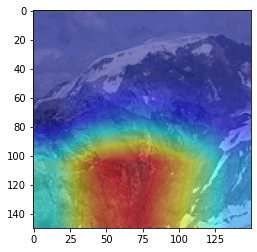

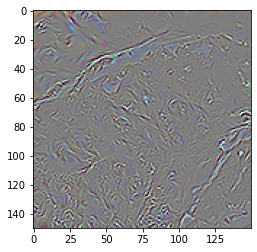

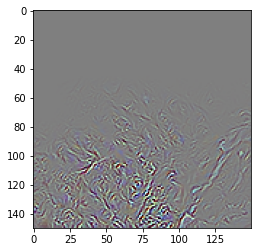

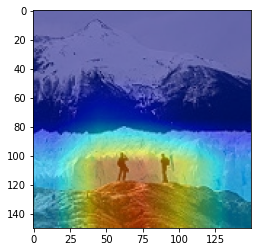

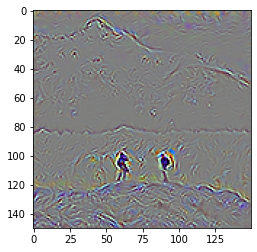

...

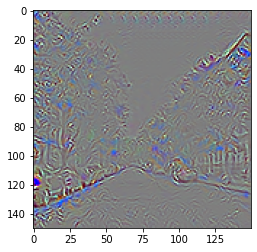

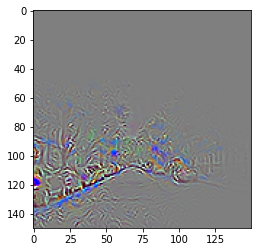

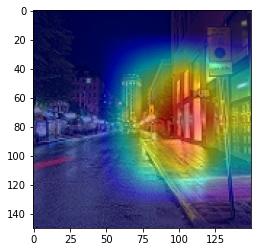

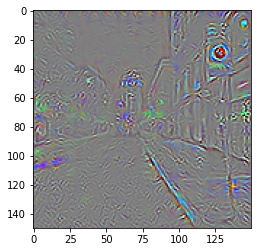

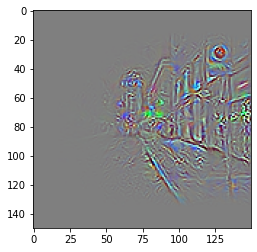

In [18]:
# Choose the images for which the GradCam must be computed
from imutils import paths
import matplotlib as mpl
mpl.rcParams['figure.max_open_warning'] = 0  #remove warning

imgs_path = list(paths.list_images(gdrivePath+"/NatureDatasetGradCam"))
print(imgs_path)

for img_path in imgs_path:
  compute_grad_cam(img_path,"resnet18",save=True,save_folder_path=saving_path,show_saving_path=False,imshow=True)